In [1]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns

In [3]:
cli_df=pd.read_excel('/Users/keyan/Downloads/Final_PQL_VS_CO2_Emissions_Without_LCI_Energy.xlsx')

cli_df.head(100)

,Country,Year,Country and Year,Consumption-based CO2 emissions tonnes per person,Human Development Index,Population (historical),"GDP per capita, PPP (constant 2021 international dollars)",Daily calorie supply per person,Expected years of schooling,Share of 1 y/o with three doses of the hepatitis B vaccine,Share of the population using basic drinking water services,Share of the population using basic sanitation services,Net enrolment rate in primary education,Access to electricity (Share of population),Share of 1 y/o with DTP3 vaccines
0,Argentina,1990.0,Argentina: 1990,3.449,0.733,32755859.0,17007.285,2899.3706,13.392489,NaN,NaN,NaN,NaN,0.921548,0.87
1,Argentina,1991.0,Argentina: 1991,3.653,0.739,33230247.0,18295.610,2995.9377,13.352440,NaN,NaN,NaN,0.958327,0.924922,0.80
2,Argentina,1992.0,Argentina: 1992,3.817,0.743,33693487.0,19476.283,3061.2478,13.312510,NaN,NaN,NaN,NaN,0.928295,0.81
3,Argentina,1993.0,Argentina: 1993,3.629,0.748,34152666.0,20791.346,3098.6042,13.272580,NaN,NaN,NaN,NaN,0.931665,0.81
4,Argentina,1994.0,Argentina: 1994,3.587,0.753,34613440.0,21711.844,3135.4539,13.232650,NaN,NaN,NaN,NaN,0.935127,0.82
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Austria,2019.0,Austria: 2019,10.068,0.928,8880830.0,65312.023,3813.1980,16.076250,0.85,1.0,0.999727,0.987664,1.000000,0.85
96,Austria,2020.0,Austria: 2020,9.072,0.925,8921362.0,60931.940,3764.0810,16.124470,0.85,1.0,0.999726,0.988252,1.000000,0.85
97,Austria,2021.0,Austria: 2021,9.813,0.930,8967006.0,63576.242,3765.1907,16.367460,0.86,1.0,0.999725,0.995221,1.000000,0.86
98,Austria,2022.0,Austria: 2022,9.427,0.927,9064633.0,66294.720,3759.6050,16.284280,0.84,1.0,0.999724,0.983248,1.000000,0.84


In [5]:
climate_df = cli_df.replace([np.inf, -np.inf], np.nan).dropna()

climate_df

#Cleaned Dataset where rows with any N/A values are removed. Could've used climate_df = cli_df.dropna()

,Country,Year,Country and Year,Consumption-based CO2 emissions tonnes per person,Human Development Index,Population (historical),"GDP per capita, PPP (constant 2021 international dollars)",Daily calorie supply per person,Expected years of schooling,Share of 1 y/o with three doses of the hepatitis B vaccine,Share of the population using basic drinking water services,Share of the population using basic sanitation services,Net enrolment rate in primary education,Access to electricity (Share of population),Share of 1 y/o with DTP3 vaccines
12,Argentina,2002.0,Argentina: 2002,2.161,0.795,38029300.0,18571.701,2945.5854,16.392510,0.66,0.967555,0.886339,0.994278,0.961,0.93
13,Argentina,2003.0,Argentina: 2003,2.933,0.804,38424224.0,20005.139,2973.4297,16.266390,0.73,0.969824,0.896957,0.994949,0.963,0.96
14,Argentina,2004.0,Argentina: 2004,3.436,0.808,38815865.0,21591.450,2988.4597,16.298980,0.81,0.972435,0.895356,0.998760,0.965,0.98
15,Argentina,2005.0,Argentina: 2005,3.588,0.812,39216734.0,23262.408,3061.9412,16.018460,0.88,0.974212,0.899997,0.997179,0.967,0.98
16,Argentina,2006.0,Argentina: 2006,3.810,0.822,39622060.0,24877.250,3064.2460,16.173730,0.84,0.976332,0.946378,0.995616,0.970,0.91
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3844,Zimbabwe,2018.0,Zimbabwe: 2018,0.729,0.586,15034396.0,3572.984,2070.6565,10.962130,0.89,0.635388,0.363572,0.812354,0.454,0.89
3845,Zimbabwe,2019.0,Zimbabwe: 2019,0.670,0.584,15271330.0,3294.806,2038.3356,10.993813,0.90,0.639495,0.357743,0.816187,0.467,0.90
3846,Zimbabwe,2020.0,Zimbabwe: 2020,0.587,0.582,15526837.0,2987.270,2035.4940,11.025587,0.86,0.626665,0.351924,0.838571,0.527,0.86
3847,Zimbabwe,2021.0,Zimbabwe: 2021,0.680,0.581,15797165.0,3184.785,2083.9954,11.057453,0.88,0.622528,0.346995,0.957390,0.490,0.88


In [9]:
climate_df['CO2 Emissions'] = climate_df['Consumption-based CO2 emissions tonnes per person']
climate_df['HDI'] = climate_df['Human Development Index']
climate_df['GDP per capita'] = climate_df['GDP per capita, PPP (constant 2021 international dollars)']
climate_df['Calorie Consumption'] = climate_df['Daily calorie supply per person']
climate_df['Expected Schooling'] = climate_df['Expected years of schooling']
climate_df['Primary Education Enrollment'] = climate_df['Net enrolment rate in primary education']
climate_df['Electricity Access'] = climate_df['Access to electricity (Share of population)']
climate_df['Basic Sanitation'] = climate_df['Share of the population using basic sanitation services']
climate_df['Basic Water Services'] = climate_df['Share of the population using basic drinking water services']
climate_df['Hep B Vaccination'] = climate_df['Share of 1 y/o with three doses of the hepatitis B vaccine']
climate_df['DTP3 Vaccination'] = climate_df['Share of 1 y/o with DTP3 vaccines']

y=climate_df['GDP per capita']
x=sm.add_constant(climate_df[['Consumption-based CO2 emissions tonnes per person', 'Human Development Index', 'Daily calorie supply per person', 
                               'Expected years of schooling', 
                               'Net enrolment rate in primary education', 'Access to electricity (Share of population)', 
                               'Share of the population using basic sanitation services', 
                               'Share of the population using basic drinking water services', 
                               'Share of 1 y/o with three doses of the hepatitis B vaccine', 
                               'Share of 1 y/o with DTP3 vaccines']])

final_climate_GDP_model = sm.OLS(y, x).fit()


print(final_climate_GDP_model.summary())

                            OLS Regression Results                            
Dep. Variable:         GDP per capita   R-squared:                       0.820
Model:                            OLS   Adj. R-squared:                  0.819
Method:                 Least Squares   F-statistic:                     788.3
Date:                Thu, 31 Jul 2025   Prob (F-statistic):               0.00
Time:                        19:19:19   Log-Likelihood:                -18575.
No. Observations:                1744   AIC:                         3.717e+04
Df Residuals:                    1733   BIC:                         3.723e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                                                  coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------

In [11]:
climate_df['CO2 Emissions'] = climate_df['Consumption-based CO2 emissions tonnes per person']
climate_df['HDI'] = climate_df['Human Development Index']
climate_df['GDP per capita'] = climate_df['GDP per capita, PPP (constant 2021 international dollars)']
climate_df['Calorie Consumption'] = climate_df['Daily calorie supply per person']
climate_df['Expected Schooling'] = climate_df['Expected years of schooling']
climate_df['Primary Education Enrollment'] = climate_df['Net enrolment rate in primary education']
climate_df['Electricity Access'] = climate_df['Access to electricity (Share of population)']
climate_df['Basic Sanitation'] = climate_df['Share of the population using basic sanitation services']
climate_df['Basic Water Services'] = climate_df['Share of the population using basic drinking water services']
climate_df['Hep B Vaccination'] = climate_df['Share of 1 y/o with three doses of the hepatitis B vaccine']
climate_df['DTP3 Vaccination'] = climate_df['Share of 1 y/o with DTP3 vaccines']

y=climate_df['Human Development Index']
x=sm.add_constant(climate_df[['Consumption-based CO2 emissions tonnes per person', 'GDP per capita', 'Daily calorie supply per person', 
                               'Expected years of schooling', 
                               'Net enrolment rate in primary education', 'Access to electricity (Share of population)', 
                               'Share of the population using basic sanitation services', 
                               'Share of the population using basic drinking water services', 
                               'Share of 1 y/o with three doses of the hepatitis B vaccine', 
                               'Share of 1 y/o with DTP3 vaccines']])

final_climate_HDI_model = sm.OLS(y, x).fit()


print(final_climate_HDI_model.summary())





#HDI Based Model. This one has a far better R^2 and adjusted R^2, at 0.953 for each, 
#as opposed to 0.820, for the GDP based one
#this is hardly surprising, I picked variables that more closely play into what affects HDI, which is a composite of income, 
#education, and health. outside of life expectancy, which is itself derived from many of the controls I put, there's numerous 
#measurements for healthcare, there's also lots of measurements for education, and it does have GDP per capita as well for one of the controls
#Outside of daily calorie supply, and access to Hep B vaccinations, every one of the variables 
#are significant, at the alpha=0.001 level
#From the looks of it, childhood education is crucial, in terms of expected years, which reveals an economy's long term outlook 
#for human capital development. While GDP per capita seems to have a strong causal effect, it's actually not as impressive as the t value 
#would indicate, for even a 10,000 dollar increase in a country's GDP per capita at PPP only increases HDI by about 0.0143, which is 
#staggeringly small. same for calories, a 1000 unit increase in calories only increases HDI by about 0.0005.
#However, the caveat is that these cannot be fully disregarded, lower GDP will tend to mean lower state capacity, meaning less 
#spent on vaccination efforts, less of an ability to provide food to people, weaker institutions, weaker anticorruption measures, and 
#less scrutiny towards graft, less of an ability to provide increased schooling, weaker disease combating efforts etc.
#So while it doesn't mean much when all else is equal, all else simply is not equal in the real world, a lower GDP will lead to les access to
#almost all of these things.
#In that sense, GDP per capita can absolutely be a bad control, as it's typically the mechanism through which these amenities are provided.

                               OLS Regression Results                              
Dep. Variable:     Human Development Index   R-squared:                       0.953
Model:                                 OLS   Adj. R-squared:                  0.953
Method:                      Least Squares   F-statistic:                     3516.
Date:                     Thu, 31 Jul 2025   Prob (F-statistic):               0.00
Time:                             19:19:27   Log-Likelihood:                 3542.1
No. Observations:                     1744   AIC:                            -7062.
Df Residuals:                         1733   BIC:                            -7002.
Df Model:                               10                                         
Covariance Type:                 nonrobust                                         
                                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------

In [13]:
climate_df['CO2 Emissions'] = climate_df['Consumption-based CO2 emissions tonnes per person']
climate_df['HDI'] = climate_df['Human Development Index']
climate_df['GDP per capita'] = climate_df['GDP per capita, PPP (constant 2021 international dollars)']
climate_df['Calorie Consumption'] = climate_df['Daily calorie supply per person']
climate_df['Expected Schooling'] = climate_df['Expected years of schooling']
climate_df['Primary Education Enrollment'] = climate_df['Net enrolment rate in primary education']
climate_df['Electricity Access'] = climate_df['Access to electricity (Share of population)']
climate_df['Basic Sanitation'] = climate_df['Share of the population using basic sanitation services']
climate_df['Basic Water Services'] = climate_df['Share of the population using basic drinking water services']
climate_df['Hep B Vaccination'] = climate_df['Share of 1 y/o with three doses of the hepatitis B vaccine']
climate_df['DTP3 Vaccination'] = climate_df['Share of 1 y/o with DTP3 vaccines']

y=climate_df['Consumption-based CO2 emissions tonnes per person']
x=sm.add_constant(climate_df[['Human Development Index', 'GDP per capita', 'Daily calorie supply per person', 
                               'Expected years of schooling', 
                               'Net enrolment rate in primary education', 'Access to electricity (Share of population)', 
                               'Share of the population using basic sanitation services', 
                               'Share of the population using basic drinking water services', 
                               'Share of 1 y/o with three doses of the hepatitis B vaccine', 
                               'Share of 1 y/o with DTP3 vaccines']])

final_climate_CO2_Emissions_model = sm.OLS(y, x).fit()


print(final_climate_CO2_Emissions_model.summary())

                                            OLS Regression Results                                           
Dep. Variable:     Consumption-based CO2 emissions tonnes per person   R-squared:                       0.729
Model:                                                           OLS   Adj. R-squared:                  0.727
Method:                                                Least Squares   F-statistic:                     465.7
Date:                                               Thu, 31 Jul 2025   Prob (F-statistic):               0.00
Time:                                                       19:19:34   Log-Likelihood:                -4397.8
No. Observations:                                               1744   AIC:                             8818.
Df Residuals:                                                   1733   BIC:                             8878.
Df Model:                                                         10                                         
Covariance

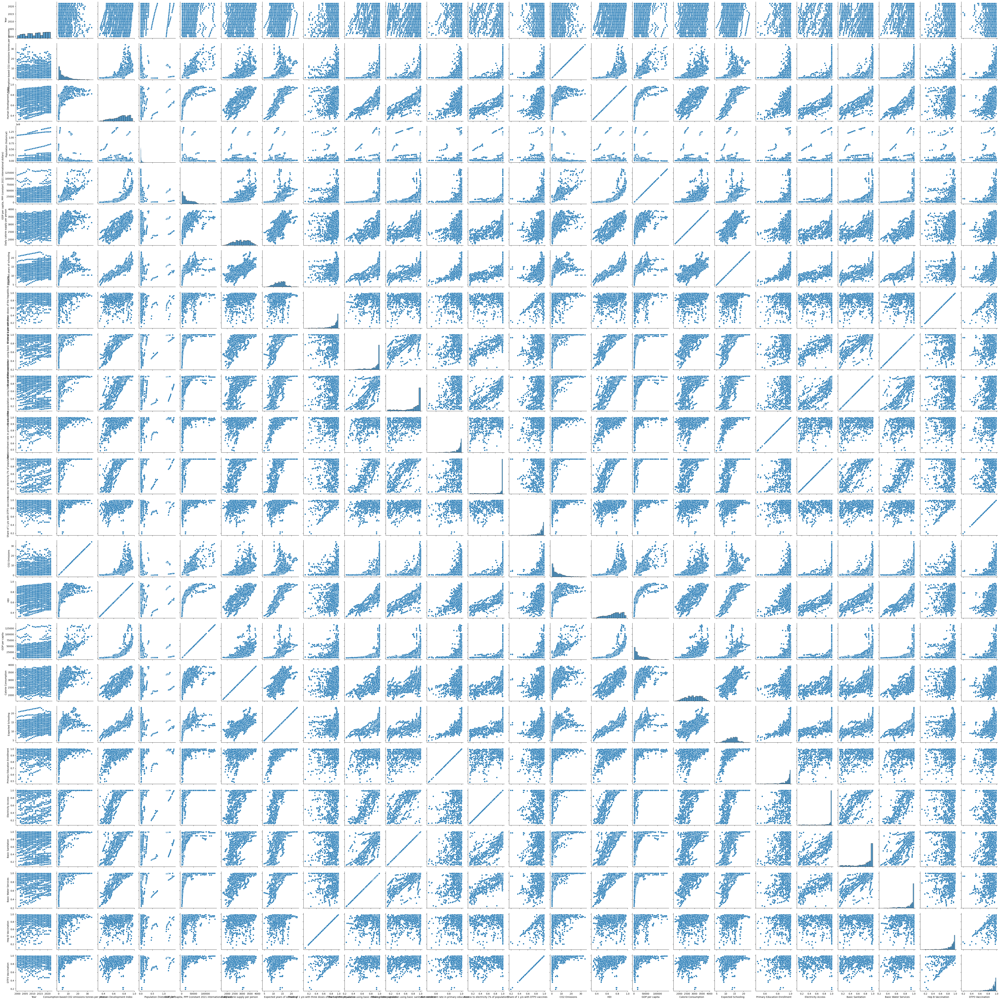

In [16]:
sns.pairplot(climate_df)